| Column Name | Description |
|-----------|-----------|
| index  | Unique index for each track (can be ignored for analysis)  |
| trak_id  | Spotify's unique identifier for the track |
| artists | Name of the performing artist(s) |
| album_name | Title of the album the track belongs to |
| track_name | Title of the track |
| popularity | Popularity score on Spotify (0–100 scale) |
| duration_ms | Duration of the track in milliseconds |
| explicir | Indicates whether the track contains explicit content |
| danceability | How suitable the track is for dancing (0.0 to 1.0) |
| energy | Intensity and activity level of the track (0.0 to 1.0) |
| key | Musical key (0 = C, 1 = C♯/D♭, …, 11 = B) |
| loudness | Overall loudness of the track in decibels (dB) |
| mode | Modality (major = 1, minor = 0) |
| speechiness | Presence of spoken words in the track (0.0 to 1.0) |
| acousticness | Confidence measure of whether the track is acoustic (0.0 to 1.0) |
| instrumentalness | Predicts whether the track contains no vocals (0.0 to 1.0) |
| liveness | Presence of an audience in the recording (0.0 to 1.0) |
| valence | Musical positivity conveyed (0.0 = sad, 1.0 = happy) |
| tempo | Estimated tempo in beats per minute (BPM) |
| time_signature | Time signature of the track (e.g., 4 = 4/4) |
| track_genre |	Assigned genre label for the track |



# Dataset

In [20]:
import pandas as pd
import numpy as np

df = pd.read_csv("dataset.csv")
df.drop(columns="index", inplace=True)
df

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,world-music
113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,world-music
113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,world-music
113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,world-music


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          114000 non-null  object 
 1   artists           113999 non-null  object 
 2   album_name        113999 non-null  object 
 3   track_name        113999 non-null  object 
 4   popularity        114000 non-null  int64  
 5   duration_ms       114000 non-null  int64  
 6   explicit          114000 non-null  bool   
 7   danceability      114000 non-null  float64
 8   energy            114000 non-null  float64
 9   key               114000 non-null  int64  
 10  loudness          114000 non-null  float64
 11  mode              114000 non-null  int64  
 12  speechiness       114000 non-null  float64
 13  acousticness      114000 non-null  float64
 14  instrumentalness  114000 non-null  float64
 15  liveness          114000 non-null  float64
 16  valence           11

In [22]:
df.isnull().sum()

track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [23]:
df.duplicated().sum()

np.int64(450)

In [24]:
df.nunique()

track_id            89741
artists             31437
album_name          46589
track_name          73608
popularity            101
duration_ms         50697
explicit                2
danceability         1174
energy               2083
key                    12
loudness            19480
mode                    2
speechiness          1489
acousticness         5061
instrumentalness     5346
liveness             1722
valence              1790
tempo               45653
time_signature          5
track_genre           114
dtype: int64

## Remove duplicates

In [25]:
df = df.drop_duplicates().reset_index(drop=True)
df.shape

(113550, 20)

In [26]:
df.duplicated().sum()

np.int64(0)

## Delete rows with null values

In [27]:
df.isnull().sum()

track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [28]:
df.replace([None], np.nan, inplace=True)
df.dropna(inplace=True)
df.isnull().sum()


track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

## Convert object type to int

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113549 entries, 0 to 113549
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          113549 non-null  object 
 1   artists           113549 non-null  object 
 2   album_name        113549 non-null  object 
 3   track_name        113549 non-null  object 
 4   popularity        113549 non-null  int64  
 5   duration_ms       113549 non-null  int64  
 6   explicit          113549 non-null  bool   
 7   danceability      113549 non-null  float64
 8   energy            113549 non-null  float64
 9   key               113549 non-null  int64  
 10  loudness          113549 non-null  float64
 11  mode              113549 non-null  int64  
 12  speechiness       113549 non-null  float64
 13  acousticness      113549 non-null  float64
 14  instrumentalness  113549 non-null  float64
 15  liveness          113549 non-null  float64
 16  valence           113549 

Gotta convert:
- track_id
- artists
- album_name
- track_name
- explicit
- track_genre

In [30]:
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder

df["explicit"] = df["explicit"].astype(int)

object_columns = df.select_dtypes(include="object").columns
encoders = {} 

for column in tqdm(object_columns):
    uniform = df[column].astype(str)
    le = LabelEncoder()
    df[column] = le.fit_transform(uniform)
    encoders[column] = le 

df 


100%|██████████| 5/5 [00:00<00:00,  7.00it/s]


,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,62845,10357,8100,11741,73,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,0
1,55667,3287,14796,22528,55,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,0
2,19766,12397,39162,60774,57,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,0
3,77941,14839,8580,9580,71,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,0
4,68241,5255,16899,25689,82,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113545,25198,22486,66,53329,21,384999,0,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,113
113546,19583,22486,66,65090,22,385000,0,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,113
113547,80126,4952,5028,38207,22,271466,0,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,113
113548,30455,18534,7238,21507,41,283893,0,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,113


In [31]:
for col, le in encoders.items():
    print(f"\nColonna: {col}")
    for cls, code in zip(le.classes_, range(len(le.classes_))):
        print(f"  {cls} --> {code}")



Colonna: track_id
  0000vdREvCVMxbQTkS888c --> 0
  000CC8EParg64OmTxVnZ0p --> 1
  000Iz0K615UepwSJ5z2RE5 --> 2
  000RDCYioLteXcutOjeweY --> 3
  000qpdoc97IMTBvF8gwcpy --> 4
  0017XiMkqbTfF2AUOzlhj6 --> 5
  001APMDOl3qtx1526T11n1 --> 6
  001YQlnDSduXd5LgBd66gT --> 7
  001pyq8FLNSL1C8orNLI0b --> 8
  002qpSULhHAw6DGqFxbaO1 --> 9
  002uYDBLOvJz21C4FuArDS --> 10
  003lo4y8gOylAqDs2scLx2 --> 11
  003vvx7Niy0yvhvHt4a68B --> 12
  004G9E3EZhxxn5aE9yEQqx --> 13
  004h8smbIoAkUNDJvVKwkG --> 14
  004iWPkSRbvOEvAPLWHl9M --> 15
  0051nJ5xbRu8kuqPTYa9l7 --> 16
  005NLlv3rClEVqeoSyYTHU --> 17
  005U5ZHLoA4OEkWewAa32S --> 18
  0068lzo1xXa9ED8ThypHU1 --> 19
  006ATYzgynEKIPgVaT5LQM --> 20
  006Bi4j0yzwOc3y69GOlYV --> 21
  006c9li2Mybyg5vm6doEfO --> 22
  006rHBBNLJMpQs8fRC2GDe --> 23
  006tmNZLXEXPqdb23wwSN1 --> 24
  0072MKNpMeJNx8aRfTNfQW --> 25
  007NMTR9MQrqwCmbjNSjKj --> 26
  007t1Fel5tcxHOEfSYWuGM --> 27
  007ufdfvS8NxnwuwSkOdw4 --> 28
  0084XCqFNqZ5K8DliXVSXh --> 29
  008KWijTsFnZRK3E7oGNxl --> 30

## Convert popularity in 0/1
- If popularity <60 then it's a flop --> 0
- If popularity >=60 then it's a bop --> 1

In [34]:
(df['popularity'] >= 60).astype(int).sum()

np.int64(14812)

In [35]:
(df['popularity'] < 60).astype(int).sum()

np.int64(98737)

In [37]:
df['popularity'] = (df['popularity'] >= 60).astype(int)
df

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,62845,10357,8100,11741,1,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,0
1,55667,3287,14796,22528,0,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,0
2,19766,12397,39162,60774,0,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,0
3,77941,14839,8580,9580,1,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,0
4,68241,5255,16899,25689,1,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113545,25198,22486,66,53329,0,384999,0,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,113
113546,19583,22486,66,65090,0,385000,0,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,113
113547,80126,4952,5028,38207,0,271466,0,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,113
113548,30455,18534,7238,21507,0,283893,0,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,113


# Data Visualization

In [38]:
import plotly.express as px

In [39]:
popularity = df['popularity']
df.drop(columns='popularity', inplace=True)
popularity

0         1
1         0
2         0
3         1
4         1
         ..
113545    0
113546    0
113547    0
113548    0
113549    0
Name: popularity, Length: 113549, dtype: int64

In [40]:
df['popularity'] = popularity
df

,track_id,artists,album_name,track_name,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,popularity
0,62845,10357,8100,11741,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,0,1
1,55667,3287,14796,22528,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,0,0
2,19766,12397,39162,60774,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,0,0
3,77941,14839,8580,9580,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,0,1
4,68241,5255,16899,25689,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113545,25198,22486,66,53329,384999,0,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,113,0
113546,19583,22486,66,65090,385000,0,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,113,0
113547,80126,4952,5028,38207,271466,0,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,113,0
113548,30455,18534,7238,21507,283893,0,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,113,0


In [41]:
px.line(df.corr()['popularity'][:-1].sort_values())

In [42]:
px.pie(df, names='popularity', title='Percentage of popular songs')

Highly unbalanced classes!!!

In [ ]:
px.histogram(df, x='explicit', color='popularity')

In [46]:
px.histogram(df, x='danceability', color='popularity')

In [47]:
px.histogram(df, x='instrumentalness', color='popularity')

The only thing that we can notice is that the more a song is instrumental, the less it's popular. This was pointed out by thee negative correlation between the popularity and  instrumentalness.

# Model Training

In [48]:
from sklearn.model_selection import train_test_split

X = df.drop(columns='popularity')
y = df['popularity']

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

## Logistic Regression

Fitting 3 folds for each of 165 candidates, totalling 495 fits
Best parameters found:  {'lr__C': 1, 'lr__class_weight': {0: 1, 1: np.float64(6.665738396624473)}, 'lr__solver': 'lbfgs'}

 Performance LR
Accuracy:  0.5353148392778512
F1_score:  0.6079038177715578
              precision    recall  f1-score   support

           0       0.92      0.51      0.66     19748
           1       0.17      0.69      0.28      2962

    accuracy                           0.54     22710
   macro avg       0.55      0.60      0.47     22710
weighted avg       0.82      0.54      0.61     22710



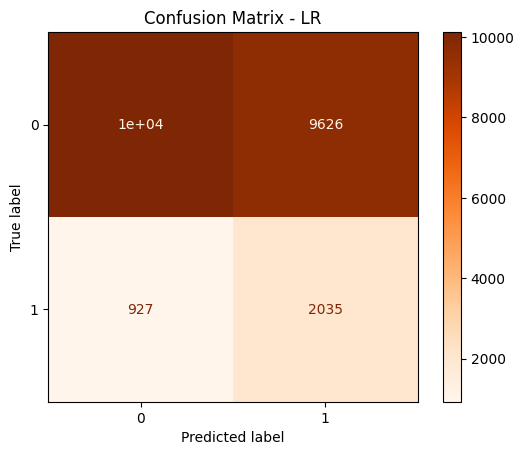

['lr.pkl']

In [75]:
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, make_scorer
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import joblib

# === Creation of the classifier ===
w_base = (y_train==0).sum() / (y_train==1).sum()
cw_grid = [{0:1, 1:w_base * a} for a in [0.25, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0, 4.0, 6.0, 8.0, 10.0]]

lr_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('lr', LogisticRegression(random_state=42, max_iter=5000))
])

lr_param_grid = {
    "lr__C" : [0.1, 1, 10, 50, 100],
    "lr__solver": ["lbfgs", "liblinear", "saga"],
    "lr__class_weight": cw_grid 
}

f1_pos = make_scorer(f1_score, average='binary', pos_label=1)

lr_grid = GridSearchCV(
    lr_pipeline,
    lr_param_grid,
    cv=3,
    scoring=f1_pos,
    n_jobs=-1,
    verbose=2
)

lr_clf = lr_grid.fit(X_train, y_train)
print("Best parameters found: ", lr_clf.best_params_)

lr_best_model = lr_clf.best_estimator_

# === Prediction ===
lr_y_pred = lr_best_model.predict(X_test)

print("\n Performance LR")
print("Accuracy: ", accuracy_score(y_test, lr_y_pred))
print("F1_score: ", f1_score(y_test, lr_y_pred, average="weighted"))
print(classification_report(y_test, lr_y_pred))

# === plotting of the results ===
cm = confusion_matrix(y_test, lr_y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Oranges')
plt.title('Confusion Matrix - LR')
plt.show()

# === Saving ===
joblib.dump(lr_best_model, 'lr.pkl')


## XGB

### More BOP found, but with less precision

Fitting 3 folds for each of 32 candidates, totalling 96 fits
[0]	validation_0-logloss:0.68317
[1]	validation_0-logloss:0.67624
[2]	validation_0-logloss:0.66932
[3]	validation_0-logloss:0.66176
[4]	validation_0-logloss:0.65595
[5]	validation_0-logloss:0.65005
[6]	validation_0-logloss:0.64168
[7]	validation_0-logloss:0.63690
[8]	validation_0-logloss:0.63314
[9]	validation_0-logloss:0.62441
[10]	validation_0-logloss:0.61543
[11]	validation_0-logloss:0.61056
[12]	validation_0-logloss:0.60443
[13]	validation_0-logloss:0.60203
[14]	validation_0-logloss:0.59919
[15]	validation_0-logloss:0.59536
[16]	validation_0-logloss:0.59235
[17]	validation_0-logloss:0.58977
[18]	validation_0-logloss:0.58762
[19]	validation_0-logloss:0.58131
[20]	validation_0-logloss:0.57996
[21]	validation_0-logloss:0.57411
[22]	validation_0-logloss:0.56821
[23]	validation_0-logloss:0.56476
[24]	validation_0-logloss:0.56347
[25]	validation_0-logloss:0.56191
[26]	validation_0-logloss:0.56011
[27]	validation_0-logloss:0.558

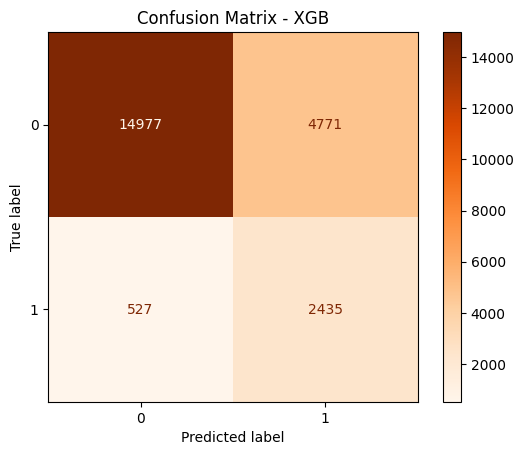

['xgb.pkl']

In [ ]:
from imblearn.pipeline import Pipeline
from xgboost import XGBClassifier 
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, make_scorer
from sklearn.model_selection import GridSearchCV, train_test_split
import matplotlib.pyplot as plt
import joblib

# === Validation split from TRAIN (no leakage) ===
X_tr, X_val, y_tr, y_val = train_test_split(
    X_train, y_train, test_size=0.2, stratify=y_train, random_state=42
)

# === Creation of the classifier ===
w_base = (y_train==0).sum() / (y_train==1).sum()

xgb_pipeline = Pipeline([
    ("xgb", XGBClassifier(
        eval_metric="logloss",       
        random_state=42,
        early_stopping_rounds=50

    ))
])

xgb_param_grid = {
    "xgb__max_depth": [4, 6],
    "xgb__learning_rate": [0.003, 0.01, 0.03, 0.1],
    "xgb__subsample": [0.8],
    "xgb__colsample_bytree": [0.8],
    "xgb__min_child_weight": [1, 3],
    "xgb__gamma": [0, 0.1],
    "xgb__scale_pos_weight": [w_base]
}

f1_pos = make_scorer(f1_score, average='binary', pos_label=1)

xgb_grid = GridSearchCV(
    xgb_pipeline,
    xgb_param_grid,
    cv=3,
    scoring=f1_pos,
    n_jobs=-1,
    verbose=2
)

fit_params = {
    "xgb__eval_set": [(X_val, y_val)]
}

xgb_clf = xgb_grid.fit(X_tr, y_tr, **fit_params)
print("Best parameters found: ", xgb_clf.best_params_)

xgb_best_model = xgb_clf.best_estimator_

# === Prediction ===
xgb_y_pred = xgb_best_model.predict(X_test)

print("\n Performance XGB")
print("Accuracy: ", accuracy_score(y_test, xgb_y_pred))
print("F1_score: ", f1_score(y_test, xgb_y_pred, average="weighted"))
print(classification_report(y_test, xgb_y_pred))

# === plotting of the results ===
cm = confusion_matrix(y_test, xgb_y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Oranges')
plt.title('Confusion Matrix - XGB')
plt.show()

# === Saving Model ===
joblib.dump(xgb_best_model, 'xgb_azardous.pkl')


### Cautious Model

Fitting 3 folds for each of 352 candidates, totalling 1056 fits
[0]	validation_0-logloss:0.49523
[1]	validation_0-logloss:0.49032
[2]	validation_0-logloss:0.48418
[3]	validation_0-logloss:0.47963
[4]	validation_0-logloss:0.47313
[5]	validation_0-logloss:0.46959
[6]	validation_0-logloss:0.46489
[7]	validation_0-logloss:0.46070
[8]	validation_0-logloss:0.45815
[9]	validation_0-logloss:0.45563
[10]	validation_0-logloss:0.45235
[11]	validation_0-logloss:0.44904
[12]	validation_0-logloss:0.44467
[13]	validation_0-logloss:0.44301
[14]	validation_0-logloss:0.44124
[15]	validation_0-logloss:0.43848
[16]	validation_0-logloss:0.43605
[17]	validation_0-logloss:0.43453
[18]	validation_0-logloss:0.43320
[19]	validation_0-logloss:0.43013
[20]	validation_0-logloss:0.42784
[21]	validation_0-logloss:0.42490
[22]	validation_0-logloss:0.42081
[23]	validation_0-logloss:0.41940
[24]	validation_0-logloss:0.41825
[25]	validation_0-logloss:0.41662
[26]	validation_0-logloss:0.41550
[27]	validation_0-logloss:0.

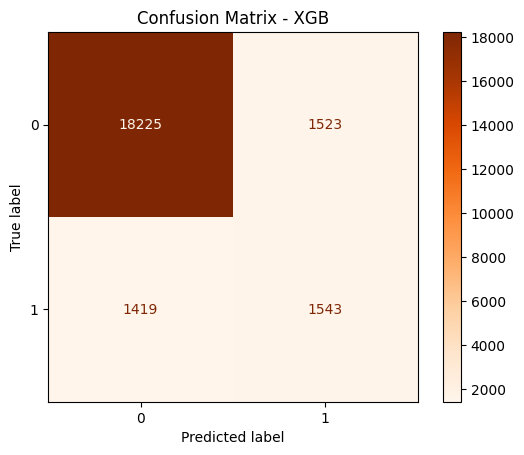

['xgb_spw_grid.pkl']

In [ ]:
from imblearn.pipeline import Pipeline
from xgboost import XGBClassifier 
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, make_scorer
from sklearn.model_selection import GridSearchCV, train_test_split
import matplotlib.pyplot as plt
import joblib

# === Validation split from TRAIN (no leakage) ===
X_tr, X_val, y_tr, y_val = train_test_split(
    X_train, y_train, test_size=0.2, stratify=y_train, random_state=42
)

# === Creation of the classifier ===
w_base = (y_train==0).sum() / (y_train==1).sum()
spw_grid = [w_base * a for a in [0.25, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0, 4.0, 6.0, 8.0, 10.0]]

xgb_pipeline = Pipeline([
    ("xgb", XGBClassifier(
        eval_metric="logloss",       
        random_state=42,
        early_stopping_rounds=50

    ))
])

xgb_param_grid = {
    "xgb__max_depth": [4, 6],
    "xgb__learning_rate": [0.003, 0.01, 0.03, 0.1],
    "xgb__subsample": [0.8],
    "xgb__colsample_bytree": [0.8],
    "xgb__min_child_weight": [1, 3],
    "xgb__gamma": [0, 0.1],
    "xgb__scale_pos_weight": spw_grid
}

f1_pos = make_scorer(f1_score, average='binary', pos_label=1)

xgb_grid = GridSearchCV(
    xgb_pipeline,
    xgb_param_grid,
    cv=3,
    scoring=f1_pos,
    n_jobs=-1,
    verbose=2
)

fit_params = {
    "xgb__eval_set": [(X_val, y_val)]
}

xgb_clf = xgb_grid.fit(X_tr, y_tr, **fit_params)
print("Best parameters found: ", xgb_clf.best_params_)

xgb_best_model = xgb_clf.best_estimator_

# === Prediction ===
xgb_y_pred = xgb_best_model.predict(X_test)

print("\n Performance XGB")
print("Accuracy: ", accuracy_score(y_test, xgb_y_pred))
print("F1_score: ", f1_score(y_test, xgb_y_pred, average="weighted"))
print(classification_report(y_test, xgb_y_pred))

# === plotting of the results ===
cm = confusion_matrix(y_test, xgb_y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Oranges')
plt.title('Confusion Matrix - XGB')
plt.show()

# === Saving Model ===
joblib.dump(xgb_best_model, 'xgb_cautious.pkl')


### Maximum Recall --> Don't miss BOP

Fitting 3 folds for each of 352 candidates, totalling 1056 fits
[0]	validation_0-logloss:0.84582
[1]	validation_0-logloss:0.83658
[2]	validation_0-logloss:0.82700
[3]	validation_0-logloss:0.81646
[4]	validation_0-logloss:0.80867
[5]	validation_0-logloss:0.80054
[6]	validation_0-logloss:0.78984
[7]	validation_0-logloss:0.78346
[8]	validation_0-logloss:0.77885
[9]	validation_0-logloss:0.77234
[10]	validation_0-logloss:0.76116
[11]	validation_0-logloss:0.75269
[12]	validation_0-logloss:0.74802
[13]	validation_0-logloss:0.74464
[14]	validation_0-logloss:0.74117
[15]	validation_0-logloss:0.73633
[16]	validation_0-logloss:0.73112
[17]	validation_0-logloss:0.72873
[18]	validation_0-logloss:0.72526
[19]	validation_0-logloss:0.71535
[20]	validation_0-logloss:0.71051
[21]	validation_0-logloss:0.70552
[22]	validation_0-logloss:0.70275
[23]	validation_0-logloss:0.69579
[24]	validation_0-logloss:0.69375
[25]	validation_0-logloss:0.69139
[26]	validation_0-logloss:0.68939
[27]	validation_0-logloss:0.

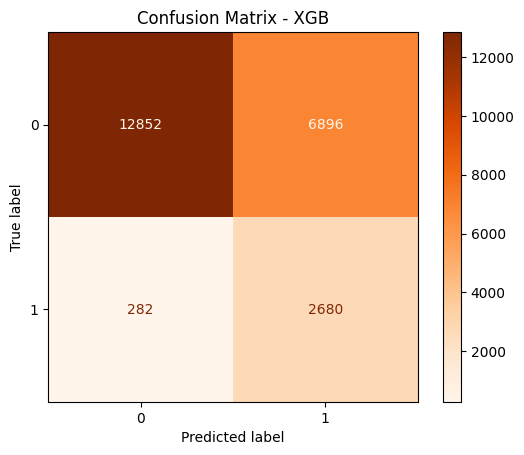

['xgb_max_recall.pkl']

In [86]:
from imblearn.pipeline import Pipeline
from xgboost import XGBClassifier 
from sklearn.metrics import accuracy_score, fbeta_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, make_scorer
from sklearn.model_selection import GridSearchCV, train_test_split
import matplotlib.pyplot as plt
import joblib

# === Validation split from TRAIN (no leakage) ===
X_tr, X_val, y_tr, y_val = train_test_split(
    X_train, y_train, test_size=0.2, stratify=y_train, random_state=42
)

# === Creation of the classifier ===
w_base = (y_train==0).sum() / (y_train==1).sum()
spw_grid = [w_base * a for a in [0.25, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0, 4.0, 6.0, 8.0, 10.0]]

xgb_pipeline = Pipeline([
    ("xgb", XGBClassifier(
        eval_metric="logloss",       
        random_state=42,
        early_stopping_rounds=50

    ))
])

xgb_param_grid = {
    "xgb__max_depth": [4, 6],
    "xgb__learning_rate": [0.003, 0.01, 0.03, 0.1],
    "xgb__subsample": [0.8],
    "xgb__colsample_bytree": [0.8],
    "xgb__min_child_weight": [1, 3],
    "xgb__gamma": [0, 0.1],
    "xgb__scale_pos_weight": spw_grid
}

fbeta_pos = make_scorer(fbeta_score, beta=2, average='binary', pos_label=1)

xgb_grid = GridSearchCV(
    xgb_pipeline,
    xgb_param_grid,
    cv=3,
    scoring=fbeta_pos,
    n_jobs=-1,
    verbose=2
)

fit_params = {
    "xgb__eval_set": [(X_val, y_val)]
}

xgb_clf = xgb_grid.fit(X_tr, y_tr, **fit_params)
print("Best parameters found: ", xgb_clf.best_params_)

xgb_best_model = xgb_clf.best_estimator_

# === Prediction ===
xgb_y_pred = xgb_best_model.predict(X_test)

print("\n Performance XGB")
print("Accuracy: ", accuracy_score(y_test, xgb_y_pred))
print("F1_score: ", f1_score(y_test, xgb_y_pred, average="weighted"))
print(classification_report(y_test, xgb_y_pred))

# === plotting of the results ===
cm = confusion_matrix(y_test, xgb_y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Oranges')
plt.title('Confusion Matrix - XGB')
plt.show()

# === Saving Model ===
joblib.dump(xgb_best_model, 'xgb_max_recall.pkl')


## MLP

In [ ]:
# ============ IMPORT ============ #
import numpy as np
import tensorflow as tf
import keras_tuner as kt

from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (accuracy_score, f1_score, classification_report,
                             confusion_matrix, ConfusionMatrixDisplay)
import matplotlib.pyplot as plt
import joblib


# ============ 0) REPRODUCIBILITY (optional but useful) ============ #
np.random.seed(42)
tf.random.set_seed(42)


# ============ 1) SCALING (fit ONLY on train set) ============ #
scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s  = scaler.transform(X_test)


# ============ 2) CLASS WEIGHTS (balance the positive class "BOP"=1) ============ #
neg = int((y_train == 0).sum())   # number of FLOP
pos = int((y_train == 1).sum())   # number of BOP
w_pos = neg / pos                 # suggested weight ≈ #neg / #pos
class_weight = {0: 1.0, 1: float(w_pos)}
print("Class weights:", class_weight)


# ============ 3) MODEL BUILDER (used by Keras Tuner) ============ #
def build_model(hp: kt.HyperParameters):
    model = Sequential()
    model.add(Input(shape=(X_train_s.shape[1],)))

    # hidden layers: number of layers, units and dropout are tuned
    num_layers = hp.Int('num_layers', min_value=2, max_value=4)
    for i in range(num_layers):
        units   = hp.Int(f'units_{i}', min_value=32, max_value=256, step=32)
        dr_rate = hp.Float(f'dropout_{i}', min_value=0.1, max_value=0.5, step=0.1)
        model.add(Dense(units, activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(dr_rate))

    # binary output (probability of BOP)
    model.add(Dense(1, activation='sigmoid'))

    # learning rate tuned in log scale
    lr = hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')

    # metrics for imbalanced classes: PR-AUC + precision + recall
    model.compile(
        optimizer=Adam(learning_rate=lr),
        loss='binary_crossentropy',
        metrics=[
            'accuracy',
            tf.keras.metrics.AUC(name='pr_auc', curve='PR'),
            tf.keras.metrics.Precision(name='precision'),
            tf.keras.metrics.Recall(name='recall')
        ]
    )
    return model


# ============ 4) TUNER (Hyperband) ============ #
tuner = kt.Hyperband(
    build_model,
    objective=kt.Objective('val_pr_auc', direction='max'),  # optimize PR-AUC on validation
    max_epochs=50,
    factor=3,
    directory='my_dir',
    project_name='spotify_bopflop_mlp'
)

# simple and useful callbacks
early_stop = EarlyStopping(monitor='val_pr_auc', mode='max', patience=6, restore_best_weights=True)
reduce_lr  = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6)
ckpt       = ModelCheckpoint('mlp_bopflop.keras', monitor='val_pr_auc', mode='max', save_best_only=True)


# ============ 5) HYPERPARAMETER SEARCH ============ #
tuner.search(
    X_train_s, y_train,
    validation_split=0.2,     # tuner automatically creates a validation split from train
    epochs=50,
    batch_size=512,           # larger batch size = more stable training
    class_weight=class_weight,# balance the imbalanced dataset
    callbacks=[early_stop, reduce_lr, ckpt],
    verbose=1
)

# retrieve the best model and hyperparameters from the tuner
best_model = tuner.get_best_models(num_models=1)[0]
best_hp    = tuner.get_best_hyperparameters(1)[0]
print("Best hyperparameters:", best_hp.values)


# ============ 6) TEST EVALUATION (default threshold 0.5) ============ #
# model outputs probabilities; convert to 0/1 with threshold 0.5
proba_test = best_model.predict(X_test_s).ravel()
y_pred     = (proba_test >= 0.5).astype(int)

print("\nMLP – Performance (threshold = 0.5)")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1_weighted:", f1_score(y_test, y_pred, average='weighted'))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm).plot(cmap="Oranges")
plt.title("Confusion Matrix – MLP (thr=0.5)")
plt.show()


# ============ 7) SAVE FOR DEPLOYMENT ============ #
# - checkpoint already saved the best model as 'mlp_bopflop.keras'
# - save the scaler too, to reuse in production
joblib.dump(scaler, "scaler.pkl")

# ===== EXAMPLE: inference in production =====
# X_new_s = scaler.transform(X_new)          # scale new features
# p = best_model.predict(X_new_s).ravel()[0] # probability of BOP
# pred = int(p >= 0.5)                       # 1=BOP, 0=FLOP (you can change threshold if needed)
